In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2005


In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.20,2.35,2.78,2.99,2.69,2.29,2.20,2.66,3.39,3.31,2.49,1.86
1,1.0,2.34,2.49,2.91,3.06,2.78,2.39,2.30,2.69,3.31,3.25,2.53,1.96
2,1.5,2.45,2.60,3.00,3.10,2.85,2.48,2.37,2.69,3.23,3.19,2.55,2.05
3,2.0,2.52,2.68,3.06,3.10,2.87,2.52,2.41,2.68,3.13,3.10,2.56,2.12
4,2.5,2.57,2.72,3.07,3.06,2.84,2.52,2.42,2.64,3.03,3.01,2.55,2.18


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.000000,200.000000
mean,50.250000,2.981750,2.882100,2.932250,2.895750,2.792800,2.616750,2.506750,2.521550,2.62665,2.647200,2.643800,2.644050
std,28.939592,0.175472,0.108167,0.048737,0.058468,0.072799,0.085189,0.062574,0.042333,0.10374,0.094301,0.053365,0.146918
min,0.500000,2.200000,2.350000,2.780000,2.710000,2.510000,2.290000,2.200000,2.360000,2.52000,2.560000,2.460000,1.860000
25%,25.375000,2.957500,2.850000,2.910000,2.870000,2.780000,2.610000,2.500000,2.520000,2.60000,2.620000,2.640000,2.640000
50%,50.250000,3.040000,2.915000,2.930000,2.900000,2.820000,2.650000,2.530000,2.520000,2.60000,2.620000,2.650000,2.690000
75%,75.125000,3.100000,2.960000,2.950000,2.920000,2.840000,2.670000,2.540000,2.520000,2.61000,2.620000,2.660000,2.730000
max,100.000000,3.130000,2.980000,3.070000,3.100000,2.870000,2.680000,2.560000,2.690000,3.39000,3.310000,2.760000,2.750000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,4.201093,2.637739,0.155314,0.333932,1.325251,1.855239,1.190666,0.014636,-1.112601,-1.140653,0.430729,3.088354
Jan,4.201093,0.030790,0.018644,0.002190,0.002388,0.009764,0.014253,0.010164,0.000617,-0.010311,-0.009842,0.005814,0.024975
Feb,2.637739,0.018644,0.011700,0.001940,0.002030,0.006286,0.008769,0.006193,0.000507,-0.005758,-0.005462,0.003375,0.014766
Mar,0.155314,0.002190,0.001940,0.002375,0.002408,0.002263,0.001906,0.001588,0.001308,0.001145,0.001345,0.001637,0.001611
Apr,0.333932,0.002388,0.002030,0.002408,0.003419,0.003329,0.002428,0.001681,0.002227,0.003436,0.003229,0.001617,0.000918
May,1.325251,0.009764,0.006286,0.002263,0.003329,0.005300,0.005660,0.003924,0.002094,0.000481,0.000299,0.002671,0.006939
June,1.855239,0.014253,0.008769,0.001906,0.002428,0.005660,0.007257,0.005193,0.001324,-0.002985,-0.002892,0.003337,0.011238
July,1.190666,0.010164,0.006193,0.001588,0.001681,0.003924,0.005193,0.003916,0.000922,-0.002648,-0.002413,0.002817,0.008448
Aug,0.014636,0.000617,0.000507,0.001308,0.002227,0.002094,0.001324,0.000922,0.001792,0.003047,0.002778,0.001123,-0.000144
Sept,-1.112601,-0.010311,-0.005758,0.001145,0.003436,0.000481,-0.002985,-0.002648,0.003047,0.010762,0.009712,-0.001209,-0.010673


In [5]:
df.var()

Matuarity    837.500000
Jan            0.030790
Feb            0.011700
Mar            0.002375
Apr            0.003419
May            0.005300
June           0.007257
July           0.003916
Aug            0.001792
Sept           0.010762
Oct            0.008893
Nov            0.002848
Dec            0.021585
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,2.20,2.35,2.78,2.99,2.69,2.29,2.20,2.66,3.39,3.31,2.49,1.86
1,1.0,2.34,2.49,2.91,3.06,2.78,2.39,2.30,2.69,3.31,3.25,2.53,1.96
2,1.5,2.45,2.60,3.00,3.10,2.85,2.48,2.37,2.69,3.23,3.19,2.55,2.05
3,2.0,2.52,2.68,3.06,3.10,2.87,2.52,2.41,2.68,3.13,3.10,2.56,2.12
4,2.5,2.57,2.72,3.07,3.06,2.84,2.52,2.42,2.64,3.03,3.01,2.55,2.18


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

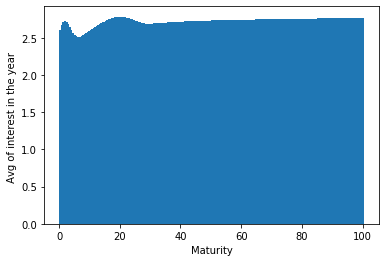

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 22 weeks

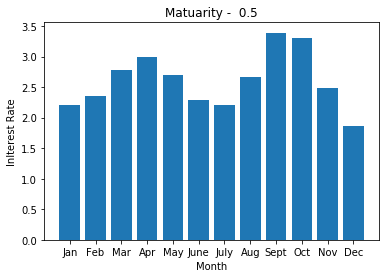

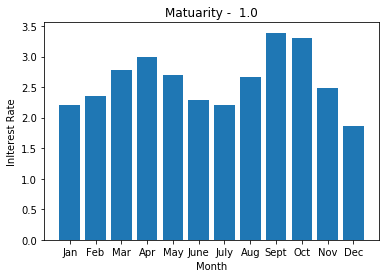

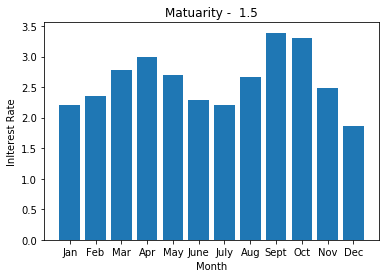

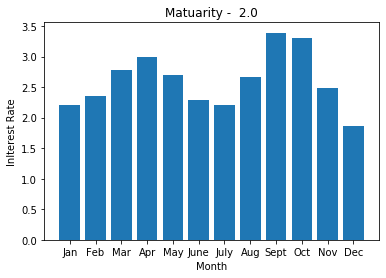

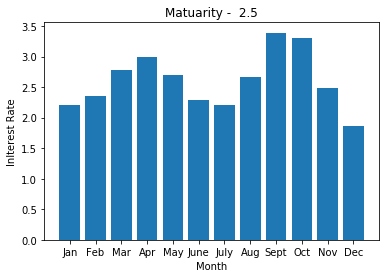

...

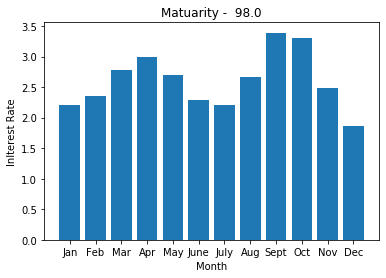

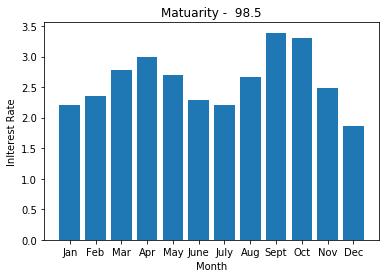

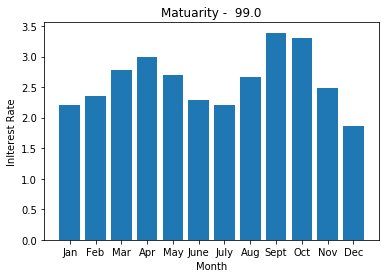

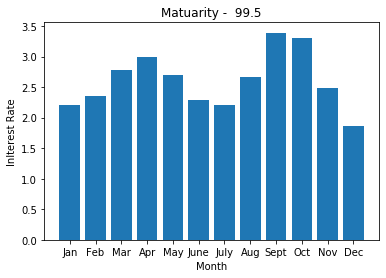

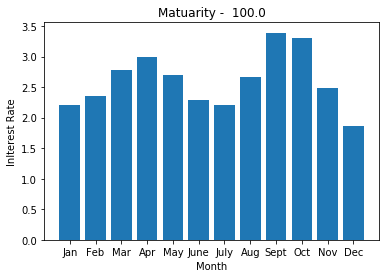

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

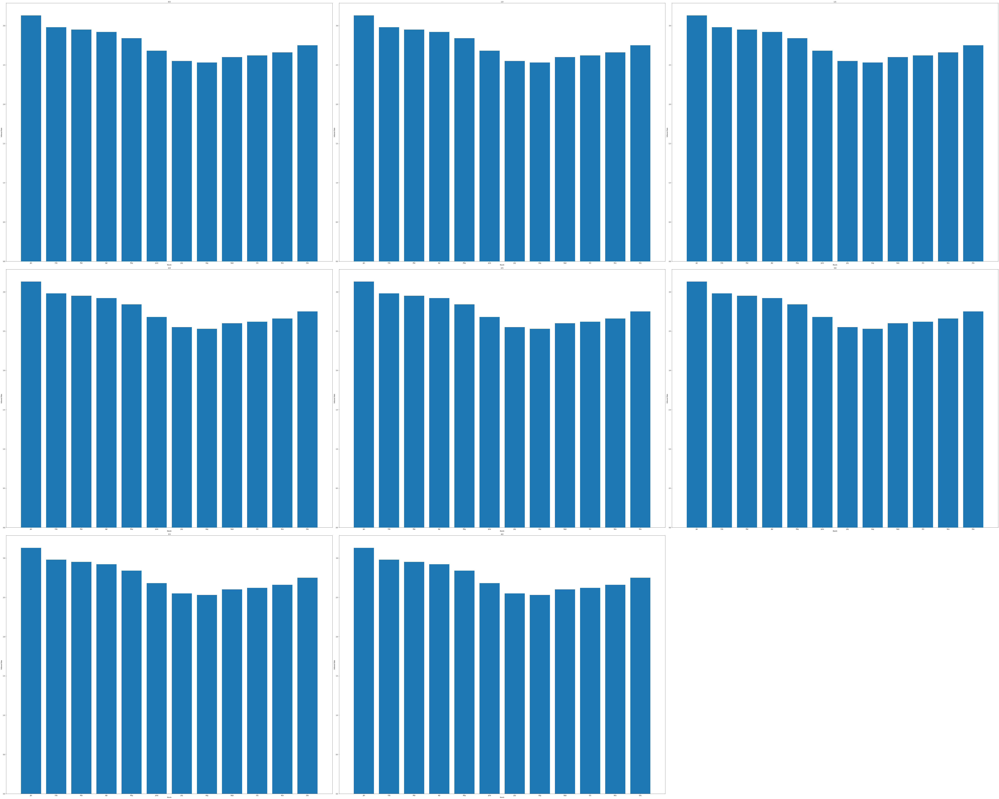

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

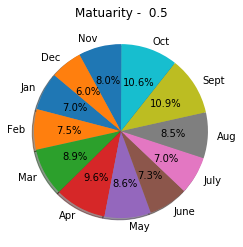

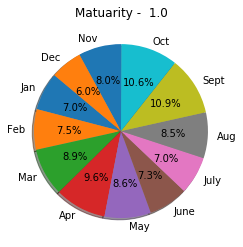

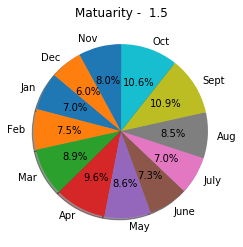

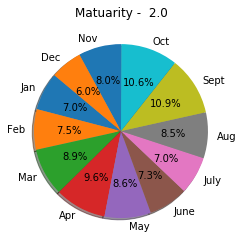

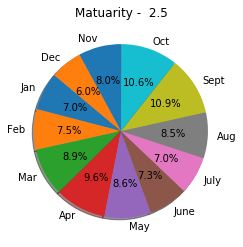

...

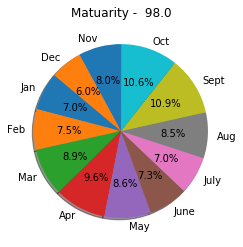

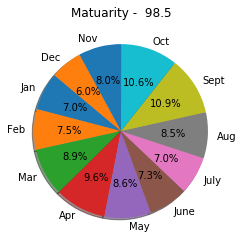

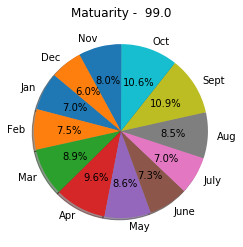

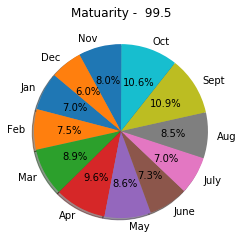

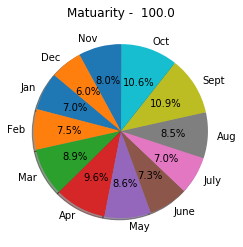

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

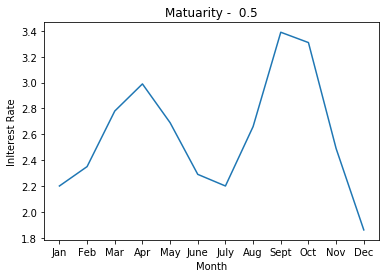

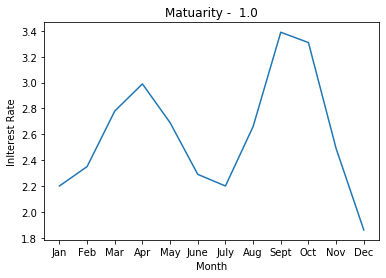

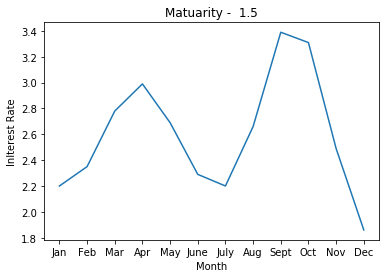

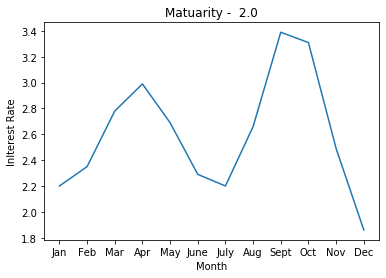

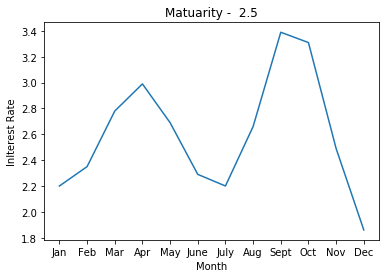

...

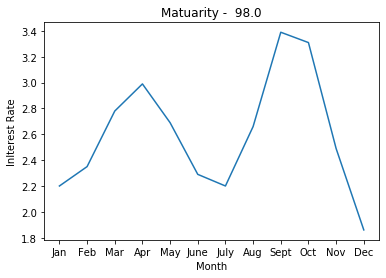

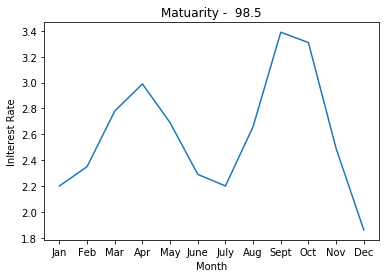

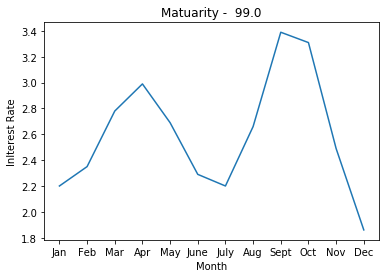

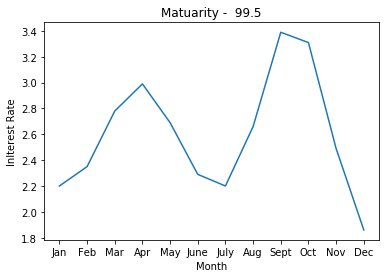

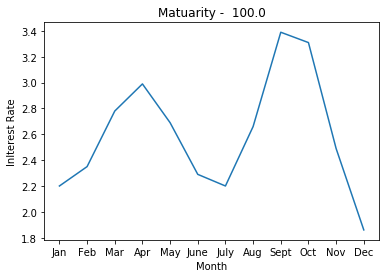

In [15]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

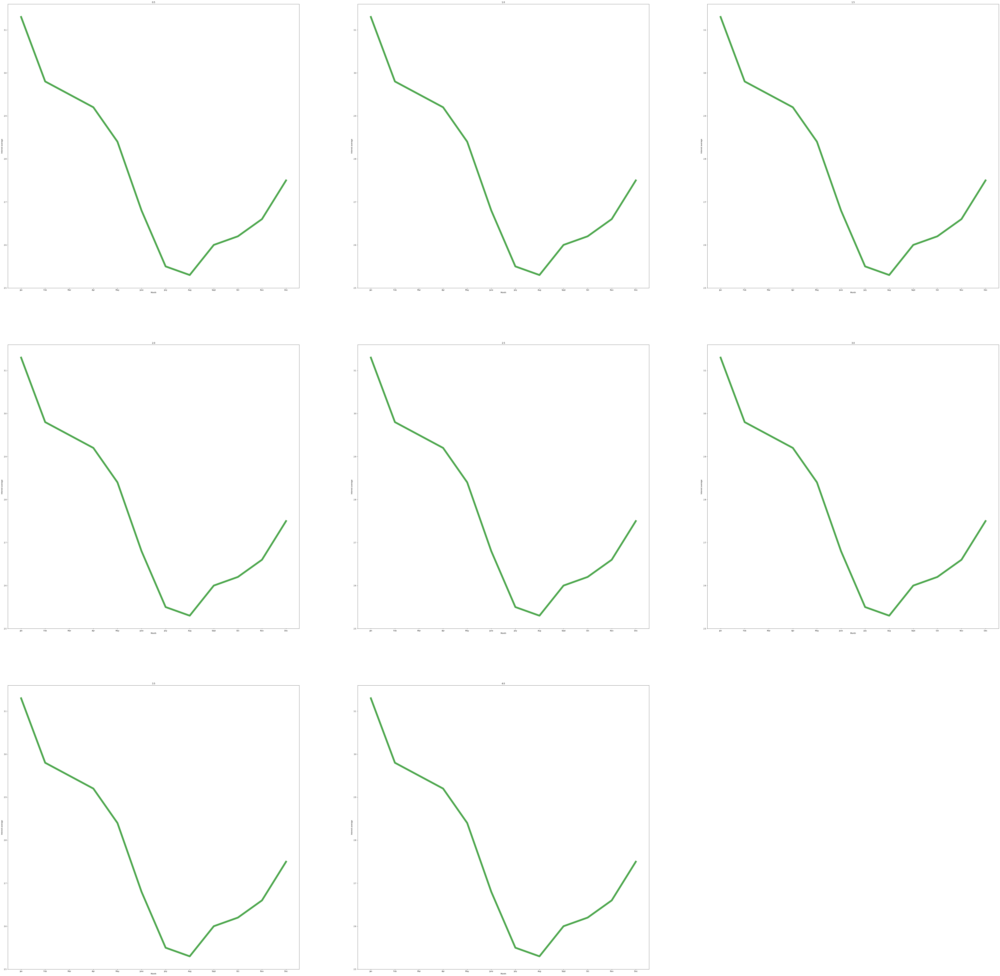

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [17]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.7242833333333336